In [1]:
!git clone https://mszarski:@github.com/mszarski/flatmesh

Cloning into 'flatmesh'...
remote: Enumerating objects: 30, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 30 (delta 4), reused 23 (delta 3), pack-reused 0
Unpacking objects: 100% (30/30), done.


In [2]:
!apt install libeigen3-dev
!ln -sf /usr/include/eigen3/Eigen /usr/include/Eigen

Reading package lists... Done
Building dependency tree       
Reading state information... Done
Suggested packages:
  libeigen3-doc libmrpt-dev
The following NEW packages will be installed:
  libeigen3-dev
0 upgraded, 1 newly installed, 0 to remove and 10 not upgraded.
Need to get 810 kB of archives.
After this operation, 7,128 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libeigen3-dev all 3.3.4-4 [810 kB]
Fetched 810 kB in 1s (1,111 kB/s)
Selecting previously unselected package libeigen3-dev.
(Reading database ... 146442 files and directories currently installed.)
Preparing to unpack .../libeigen3-dev_3.3.4-4_all.deb ...
Unpacking libeigen3-dev (3.3.4-4) ...
Setting up libeigen3-dev (3.3.4-4) ...


In [3]:
!pip install ./flatmesh

Processing ./flatmesh
  Created wheel for flatmesh: filename=flatmesh-0.0.1-cp36-cp36m-linux_x86_64.whl size=5763838 sha256=a25d8261749f23cbf246d0a5e500529dd7fa9a350009aaf69e4a90ab8a5e76df
  Stored in directory: /tmp/pip-ephem-wheel-cache-1wkq8si5/wheels/e2/ce/d5/e541f72b10062c7b5699690828825b335938ca92f396cb0fff
Successfully built flatmesh


In [4]:
!pip install trimesh open3d

     |████████████████████████████████| 634kB 4.9MB/s 
     |████████████████████████████████| 188.4MB 86kB/s 


In [5]:
from google.colab import drive
from os.path import join

ROOT = '/content/drive'     # default for the drive
PROJ = 'My Drive/draping_workspace'       # path to your project on Drive

drive.mount(ROOT)

Mounted at /content/drive


In [6]:
import trimesh
import numpy as np
from scipy.spatial import distance
import flatmesh
import matplotlib.pyplot as plt

In [7]:
curved_mesh = trimesh.load('/content/drive/My Drive/draping_workspace/apb.obj',process=False)

unable to load materials from: apb_mm.mtl
specified material (0.615686_0.811765_0.929412_0.000000_0.000000)  not loaded!


In [8]:
curved_mesh.invert()
curved_mesh.vertices *= 1e3

In [9]:
curved_mesh.show()

In [10]:
simplified_curved_mesh = curved_mesh.simplify_quadratic_decimation(curved_mesh.faces.shape[0]/2)

In [11]:
simplified_curved_mesh.show()

In [12]:
simplified_curved_mesh.export('/content/drive/My Drive/draping_workspace/apb_mm_simplified_2.obj')

'# https://github.com/mikedh/trimesh\nv 24.35520000 48.94550000 -9.31754000\nv 13.27520000 75.07280000 -5.97424000\nv -17.42560000 75.07280000 -5.97424000\nv -58.31148800 -89.27453820 -11.83368899\nv 5.38496000 -33.87630000 -30.51530000\nv 47.34911233 -40.07877049 -19.93622731\nv 32.06872577 -75.42756347 -27.29827440\nv 18.16545035 -80.10364804 -29.33174289\nv 45.09246991 -56.52937332 -22.92952576\nv -32.26390000 73.56230000 -3.45760000\nv -24.93910000 74.43250000 -4.91588000\nv 30.11262994 -62.60156596 -28.83315255\nv -11.81978606 -66.00781640 -32.67200319\nv -35.04798444 -8.65744319 -20.40919938\nv 35.34805013 -99.99449655 -14.72636408\nv -36.17570793 -67.45470274 -27.45371352\nv -8.85025000 -100.00000000 -21.23900000\nv 39.76573979 -40.63316811 -23.63944878\nv -12.18318309 -79.59330081 -30.47765618\nv 46.80855325 -84.40752134 -19.27812785\nv 2.80519965 -72.13619047 -32.59019657\nv -45.49940194 -65.94960699 -23.89753338\nv -59.65195230 -94.20252274 -7.04644334\nv -30.12723164 -37.092

INFO - 2021-02-18 05:31:54,999 - animation - Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO - 2021-02-18 05:31:55,007 - animation - MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 2160x1080 -pix_fmt rgba -r 10.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmp985b972e/temp.m4v


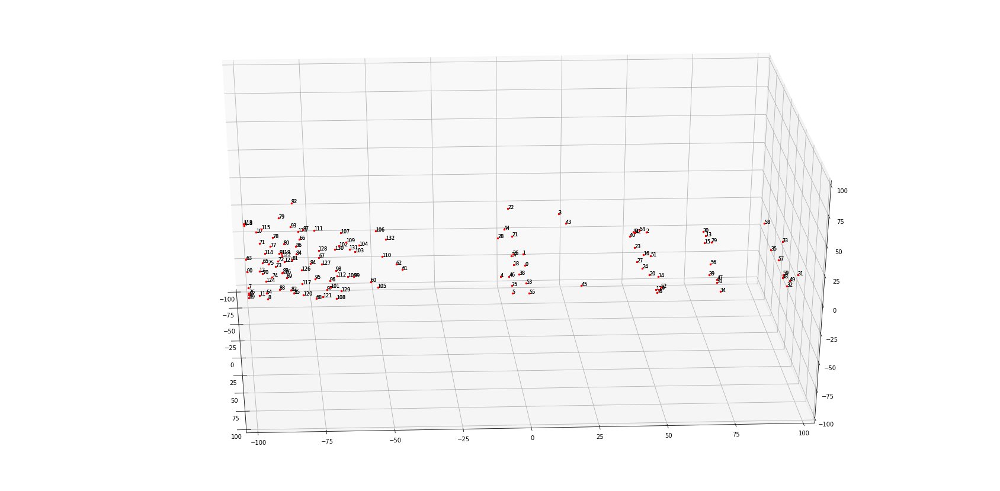

In [13]:
plt.rcParams["figure.figsize"] = (30,15)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

from IPython.display import HTML
import matplotlib.animation as animation

def init():
    for i in range(simplified_curved_mesh.vertices.shape[0]):
      ax.scatter(simplified_curved_mesh.vertices[i,0],curved_mesh.vertices[i,1],simplified_curved_mesh.vertices[i,2],c='red',s=5)
      ax.text(simplified_curved_mesh.vertices[i,0],curved_mesh.vertices[i,1],simplified_curved_mesh.vertices[i,2], str(i),fontsize=8)

    return fig,

def animate(i):
    ax.view_init(elev=30., azim=3.6*i)
    ax.set_xlim3d([-100,100])
    ax.set_ylim3d([-100,100])
    ax.set_zlim3d([-100,100])
    return fig,

# Animate
ani = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=100, blit=True)    

HTML(ani.to_html5_video())

In [14]:
v = simplified_curved_mesh.vertices
f = simplified_curved_mesh.faces

from scipy.spatial.distance import cdist

p0 = 0
distances = cdist(v, [v[p0]], 'euclidean')
p1 = distances.argmax()
dist = distances[p1][0]

# p0 = 63
# p1 = 57

flattener = flatmesh.FaceUnwrapper(v, f)
flattener.findFlatNodes(5, 0.99)
uv = flattener.ze_nodes

In [15]:
flat_vertices = np.vstack((uv[:,1], uv[:,0], np.zeros_like(uv[:,1]))).T

In [16]:
#align mesh constant seam in xy plane
v_flat = flat_vertices[p1] - flat_vertices[p0]
v_curved = v[p1] - v[p0]
v_curved[2] = 0.0
T, a = trimesh.geometry.align_vectors(v_curved, v_flat, return_angle=True)
flat_vertices = trimesh.transformations.transform_points(flat_vertices,T)

In [17]:
flat_mesh = trimesh.Trimesh(vertices=flat_vertices,
                       faces=simplified_curved_mesh.faces,
                       process=False)

In [18]:
com_delta = simplified_curved_mesh.centroid - flat_mesh.centroid
com_delta[2] = 0
flat_mesh.vertices = flat_mesh.vertices + com_delta

In [19]:
flat_mesh.show()

In [20]:
trimesh.repair.fix_normals(flat_mesh)

In [ ]:
flat_mesh.vertices = flat_mesh.vertices * 0.99

In [21]:
scene = trimesh.Scene([simplified_curved_mesh, flat_mesh])
scene.show(viewer='notebook')

In [22]:
flat_mesh.export('/content/drive/My Drive/draping_workspace/apb_mm_flatmesh_simplified_2.obj')

'# https://github.com/mikedh/trimesh\nv 24.28495121 50.68387945 0.00000000\nv 12.78078261 76.82161857 0.00000000\nv -18.03000826 76.64812361 0.00000000\nv -60.77865537 -92.74502351 0.00000000\nv 5.57159176 -34.38310522 0.00000000\nv 49.35508473 -39.74892067 0.00000000\nv 32.59040418 -75.88240495 0.00000000\nv 18.48386509 -80.72100169 0.00000000\nv 46.57959514 -56.79776644 0.00000000\nv -33.13607218 75.64014844 0.00000000\nv -25.63617673 76.21714653 0.00000000\nv 30.66526098 -62.89769991 0.00000000\nv -11.50569764 -66.55477959 0.00000000\nv -35.75127044 -8.47161860 0.00000000\nv 37.97743828 -102.88189866 0.00000000\nv -36.29476640 -68.15258653 0.00000000\nv -8.66772146 -102.43489865 0.00000000\nv 41.08396479 -40.55766939 0.00000000\nv -11.82668491 -80.37694044 0.00000000\nv 48.49130139 -85.57542615 0.00000000\nv 3.09494525 -72.54664470 0.00000000\nv -46.17810272 -66.87378826 0.00000000\nv -63.17431895 -99.35259266 0.00000000\nv -30.54645808 -37.56118312 0.00000000\nv -4.34356414 -33.597

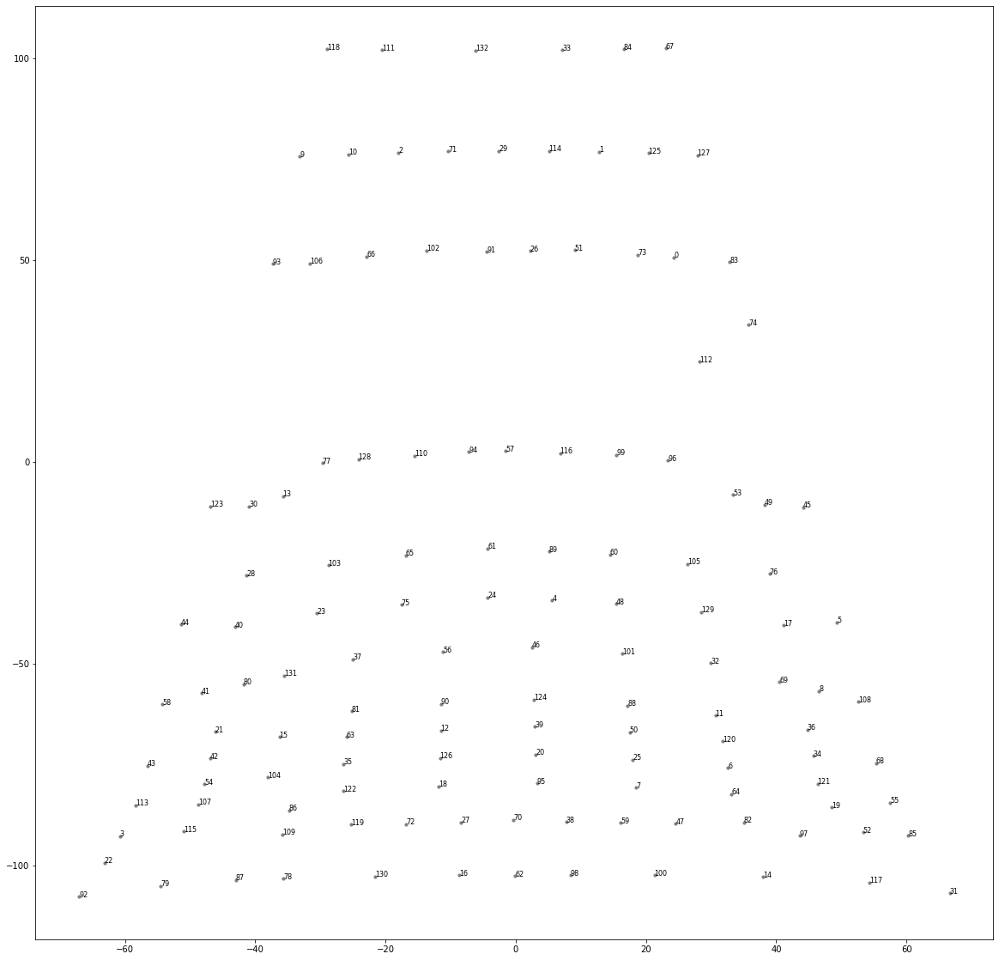

In [23]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,20)
plt.scatter(flat_mesh.vertices[:,0],flat_mesh.vertices[:,1],c='grey',s=10)
for i in range(flat_mesh.vertices.shape[0]):
    plt.text(flat_mesh.vertices[i,0], flat_mesh.vertices[i,1], str(i),fontsize=8)

In [24]:
from trimesh import grouping
# we know that in a watertight mesh every edge will be included twice
# thus every edge which appears only once is part of a boundary
boundary_groups = grouping.group_rows(
    flat_mesh.edges_sorted, require_count=1)

boundary_edges = flat_mesh.edges[boundary_groups]
index_as_dict = [{'index': i} for i in boundary_groups]

import networkx as nx

# we create a graph of the boundary edges, and find cycles.
g = nx.from_edgelist(
    np.column_stack((boundary_edges,
                     index_as_dict)))
idxs = []
for vertex in nx.cycle_basis(g):
    idxs.append(vertex)


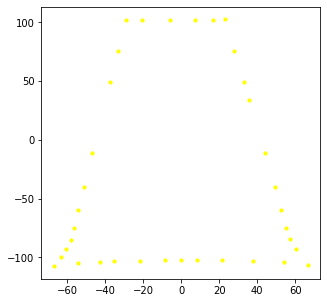

In [25]:
plt.rcParams["figure.figsize"] = (5,5)
plt.scatter(flat_mesh.vertices[idxs,0],flat_mesh.vertices[idxs,1],c='yellow',s=10)

In [26]:
np.array(idxs)

array([[ 16,  62,  98, 100,  14, 117,  31,  85,  55,  68, 108,   5,  45,
         74,  83, 127,  67,  84,  33, 132, 111, 118,   9,  93, 123,  44,
         58,  43, 113,   3,  22,  92,  79,  87,  78, 130]])

INFO - 2021-02-18 05:40:55,652 - animation - Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO - 2021-02-18 05:40:55,656 - animation - MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1080x1080 -pix_fmt rgba -r 10.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmp5vjfr0s5/temp.m4v


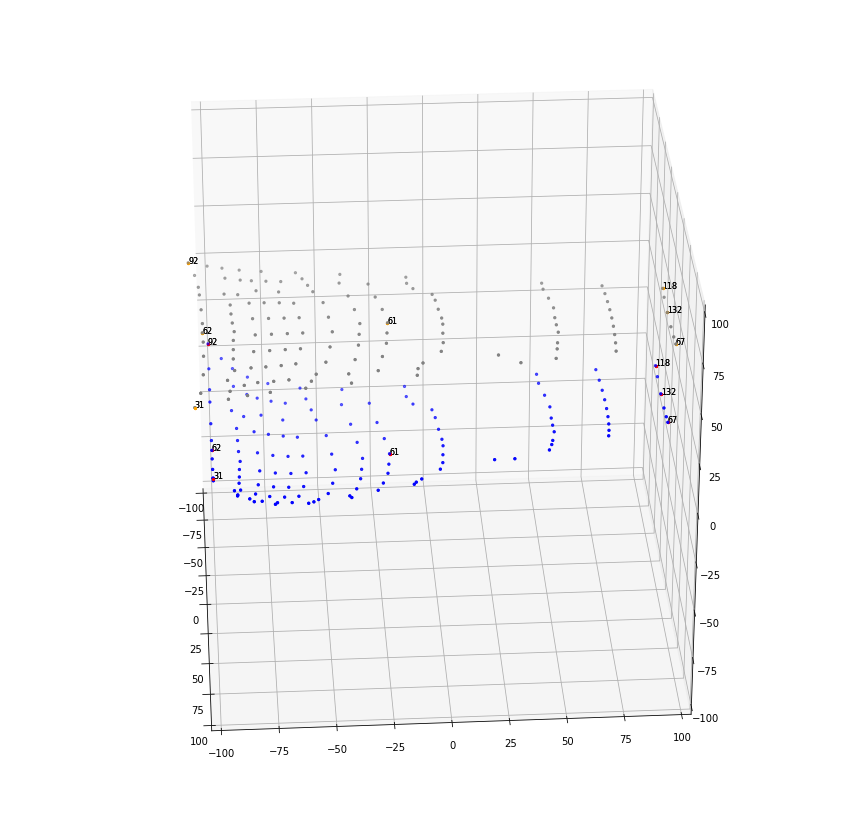

In [27]:
handles = [92,31, 118,67]
other_pts = [61, 62, 132]

plt.rcParams["figure.figsize"] = (15,15)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

from IPython.display import HTML
import matplotlib.animation as animation

def init():
    ax.scatter(flat_mesh.vertices[:,0],flat_mesh.vertices[:,1],flat_mesh.vertices[:,2]+40,c='grey',s=5)
    ax.scatter(simplified_curved_mesh.vertices[:,0],simplified_curved_mesh.vertices[:,1],simplified_curved_mesh.vertices[:,2],c='blue',s=5)
    for i in [*handles]:
        ax.scatter(flat_mesh.vertices[i,0],flat_mesh.vertices[i,1],flat_mesh.vertices[i,2]+40,c='orange',s=5)
        ax.text(flat_mesh.vertices[i,0], flat_mesh.vertices[i,1],flat_mesh.vertices[i,2]+40, str(i),fontsize=8)
        ax.scatter(simplified_curved_mesh.vertices[i,0],simplified_curved_mesh.vertices[i,1],simplified_curved_mesh.vertices[i,2],c='red',s=5)
        ax.text(simplified_curved_mesh.vertices[i,0],simplified_curved_mesh.vertices[i,1],simplified_curved_mesh.vertices[i,2], str(i),fontsize=8)

    for i in [*other_pts]:
        ax.scatter(flat_mesh.vertices[i,0],flat_mesh.vertices[i,1],flat_mesh.vertices[i,2]+40,c='orange',s=5)
        ax.text(flat_mesh.vertices[i,0], flat_mesh.vertices[i,1],flat_mesh.vertices[i,2]+40, str(i),fontsize=8)
        ax.scatter(simplified_curved_mesh.vertices[i,0],simplified_curved_mesh.vertices[i,1],simplified_curved_mesh.vertices[i,2],c='red',s=5)
        ax.text(simplified_curved_mesh.vertices[i,0],simplified_curved_mesh.vertices[i,1],simplified_curved_mesh.vertices[i,2], str(i),fontsize=8)

    return fig,

def animate(i):
    ax.view_init(elev=30., azim=3.6*i)
    ax.set_xlim3d([-100,100])
    ax.set_ylim3d([-100,100])
    ax.set_zlim3d([-100,100])
    return fig,

# Animate
ani = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=100, blit=True)    

HTML(ani.to_html5_video())